## Question 3: Motion Algorithm

Usage of Lukas Kanade optical flow detection to detectect the movement between two frames of a video.
*frame1.png corresponds to the first frame, *frame2.png to the second frame.



In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

frame1 = cv2.imread('frame1.png')
frame2 = cv2.imread('frame2.png')
frame1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2RGB)
frame2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB)
gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

In [27]:
feature_params = dict( maxCorners = 500,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7,
                       useHarrisDetector=True )

p1 = cv2.goodFeaturesToTrack(gray1, **feature_params)

In [28]:
lk_params = dict( winSize = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT,
                             10, 0.03))


p2, status, error = cv2.calcOpticalFlowPyrLK(gray1, gray2, p1, None, **lk_params)

In [29]:
# Store points if flow has been found (that is if status is 1)
good_new = p2[status==1]
good_old = p1[status==1]

mask = frame1.copy() #create copy of image in order to draw optical flow
color = np.random.randint(0, 255, (good_new.shape[0], 3))

for i, (new, old) in enumerate(zip(good_new, good_old)):
    a, b = new.ravel()
    c, d = old.ravel()
    mask = cv2.line(mask, (a,b), (c,d), color[i].tolist(), 2)

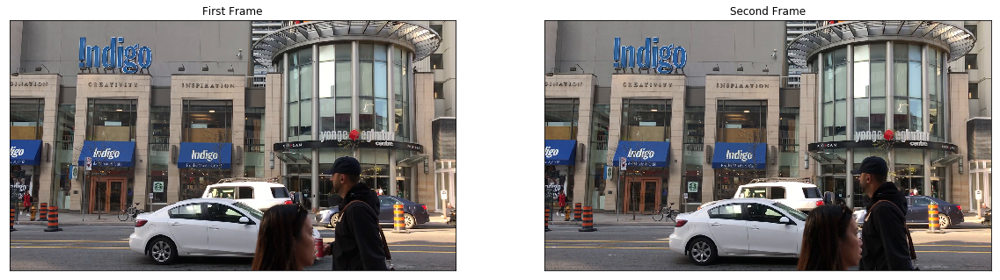

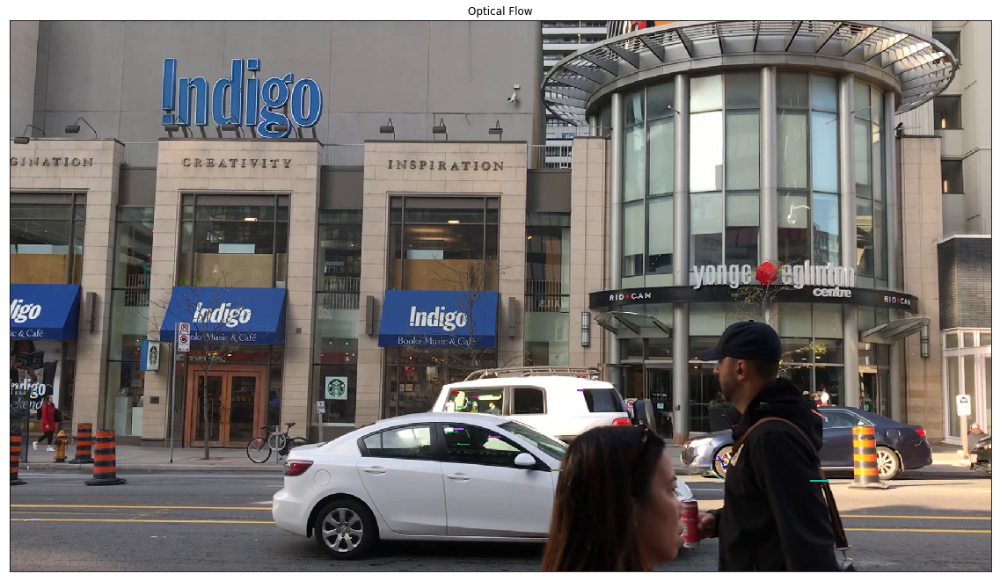

In [30]:
plt.figure(figsize=(20,20))
plt.subplot(1,2,1), plt.imshow(frame1, cmap='gray'), plt.title('First Frame'), plt.xticks([]),plt.yticks([])
plt.subplot(1,2,2), plt.imshow(frame2, cmap='gray'), plt.title('Second Frame'), plt.xticks([]),plt.yticks([])
plt.show()
plt.figure(figsize=(20,20))
plt.imshow(mask), plt.title('Optical Flow'), plt.xticks([]), plt.yticks([])
plt.show()

In [31]:
p10 = []
status10 = []
error10 = []


for i in range(11):
    lk_params = dict( winSize = (15,15),
                  maxLevel = i,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT,
                             10, 0.03))
    p10.append(cv2.calcOpticalFlowPyrLK(gray1, gray2, p1, None, **lk_params)[0])
    status10.append(cv2.calcOpticalFlowPyrLK(gray1, gray2, p1, None, **lk_params)[1])
    error10.append(cv2.calcOpticalFlowPyrLK(gray1, gray2, p1, None, **lk_params)[2])

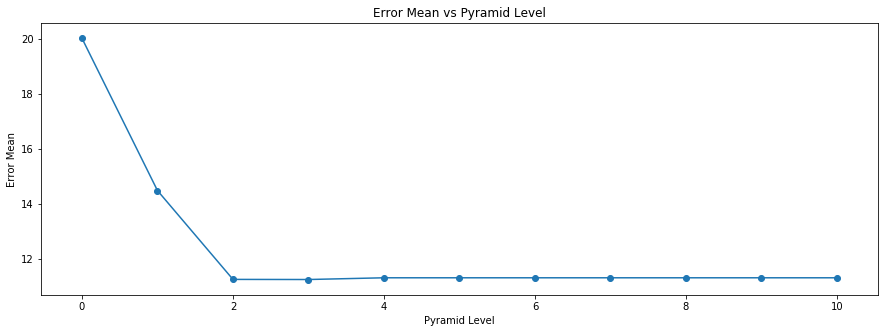

In [8]:
y = np.mean(error10,axis=1) #this is wrong, check for the ones that have status of 1
x = np.linspace(0,10,num=11)

plt.figure(figsize=(15,5))
plt.plot(x,y), plt.title('Error Mean vs Pyramid Level'),plt.xlabel('Pyramid Level'), plt.ylabel('Error Mean')
plt.scatter(x,y)
plt.show()

One can see from the graph that having a pyramid levels higher than 2 does not increase the performance, the error stays basically the same.

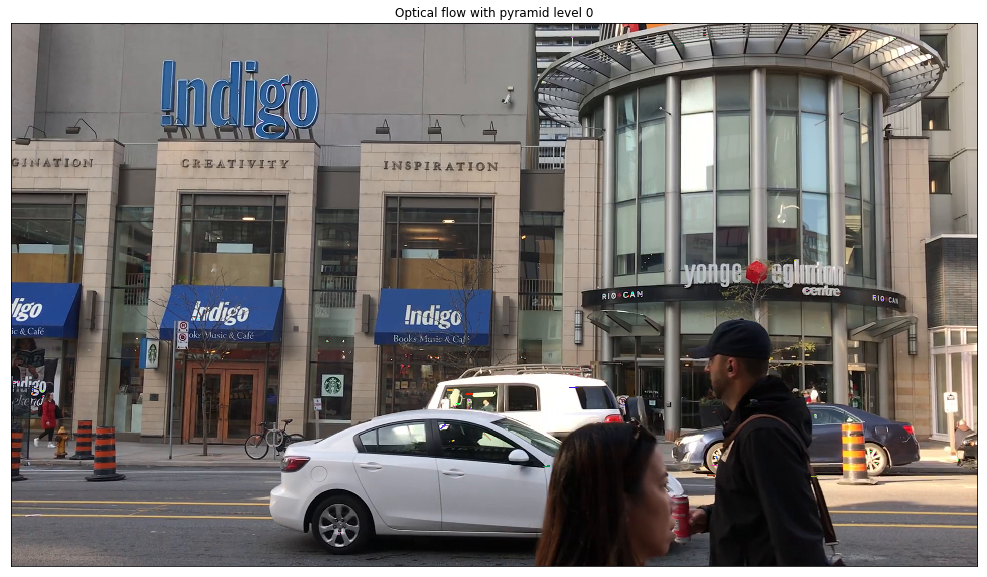

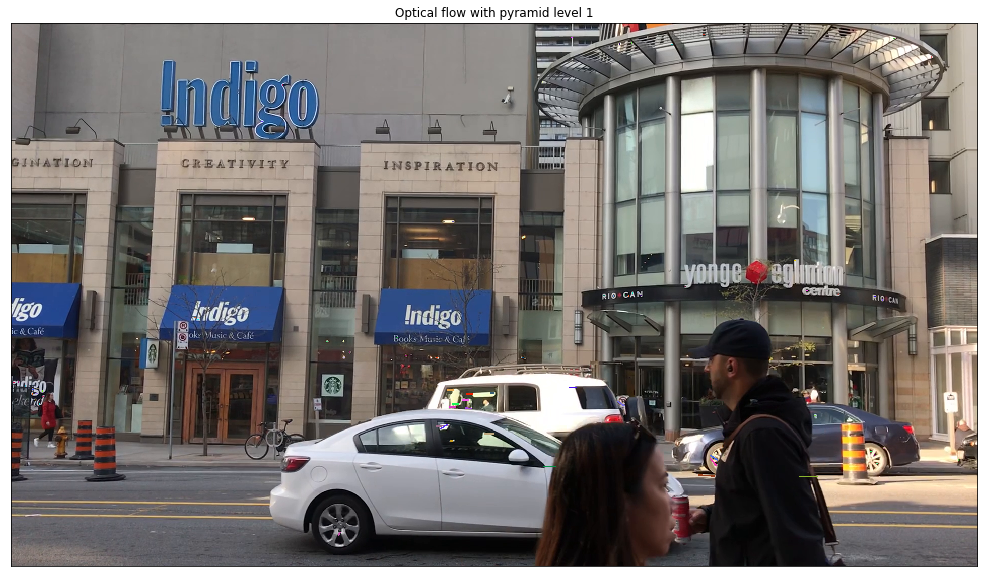

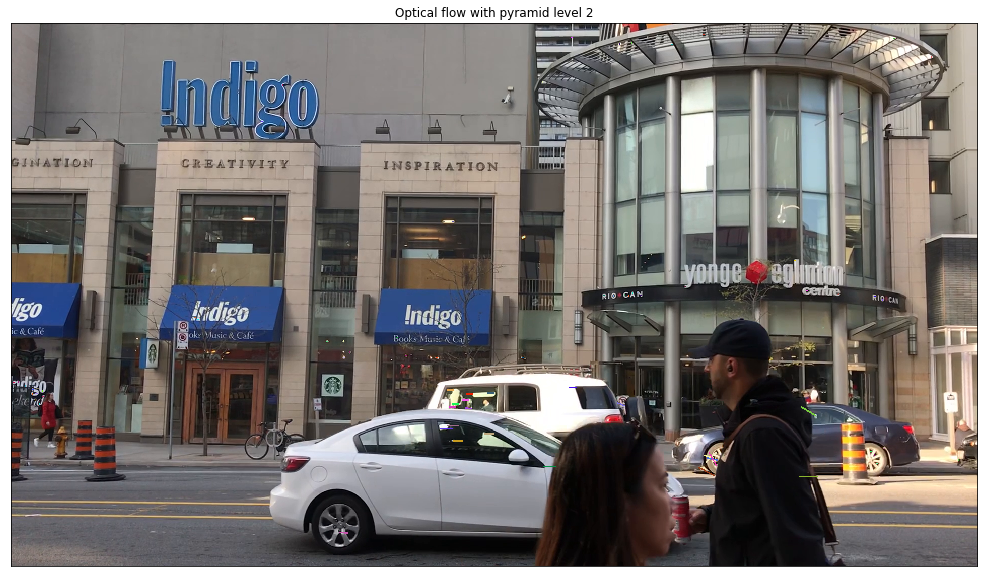

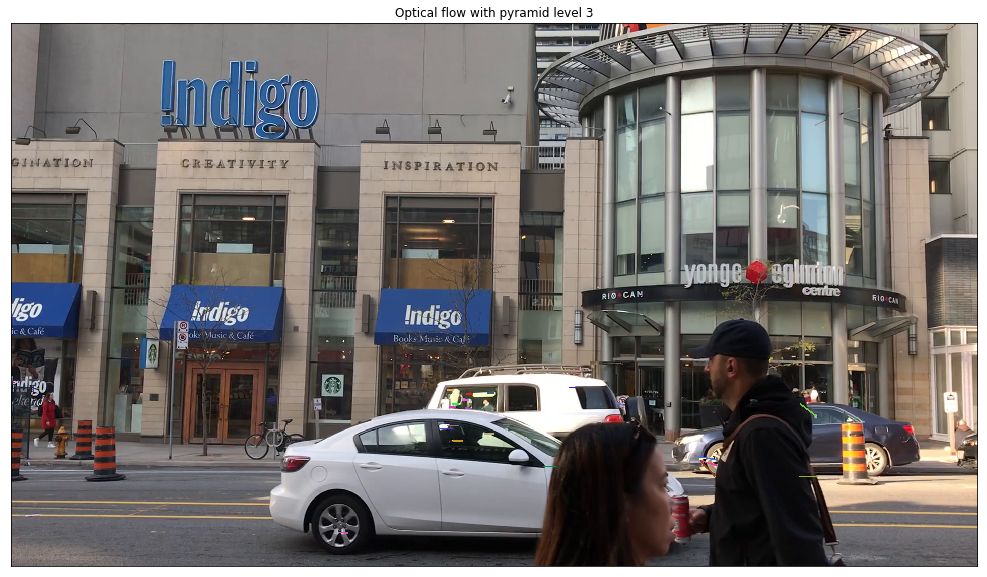

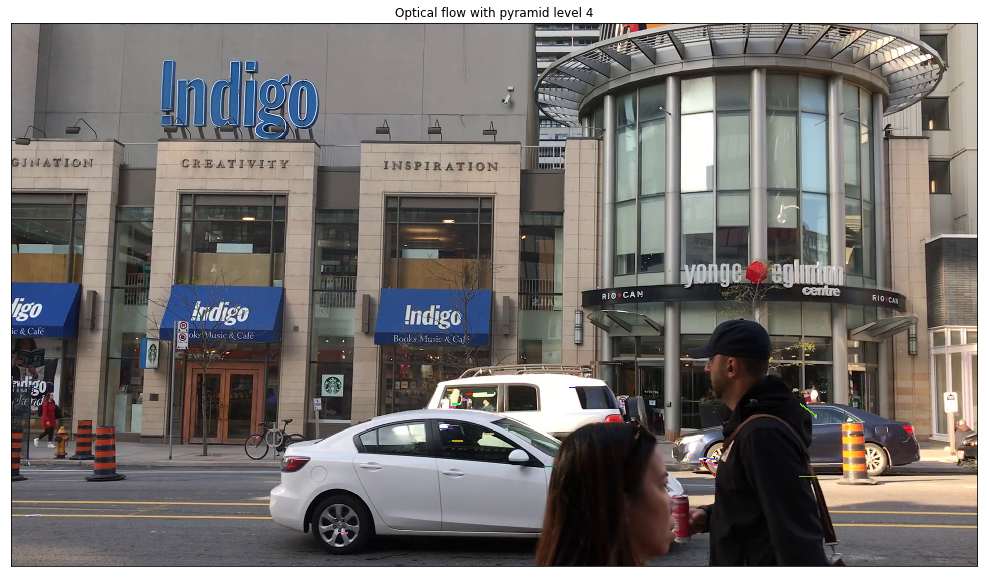

...

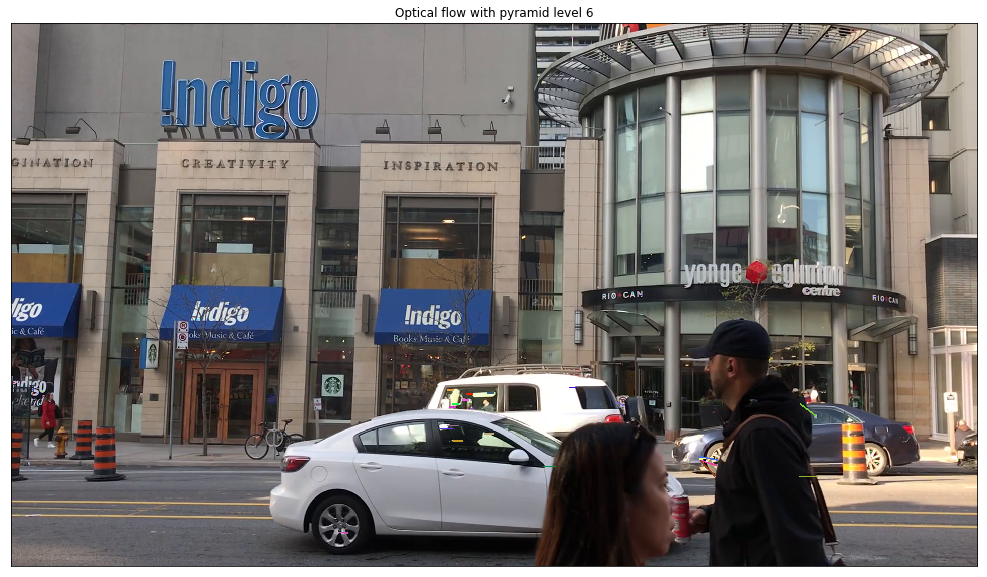

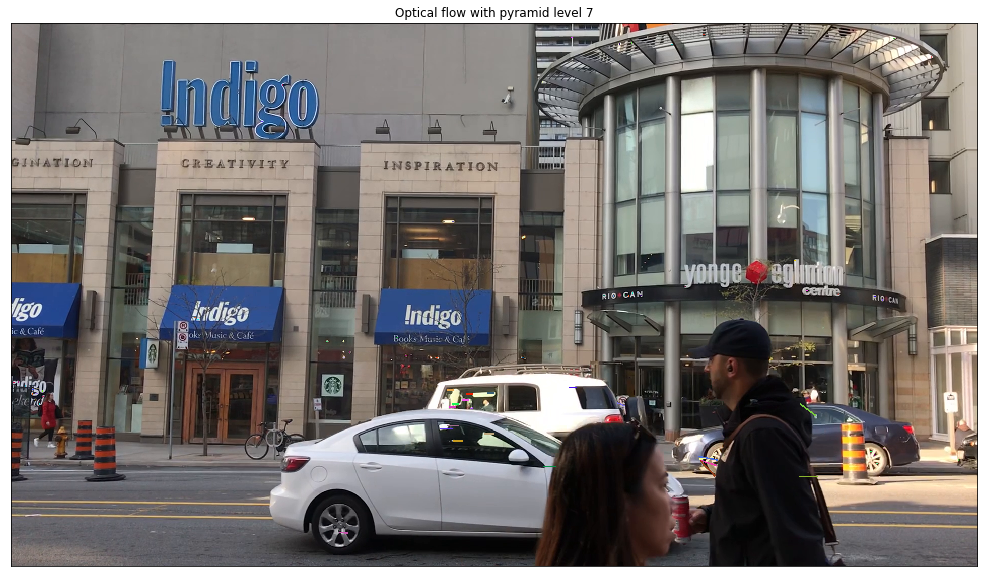

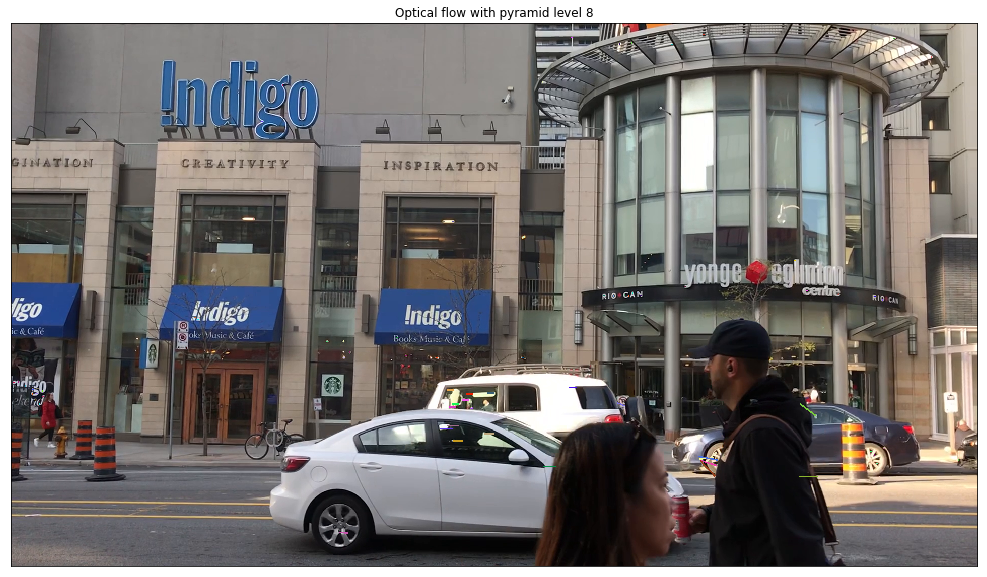

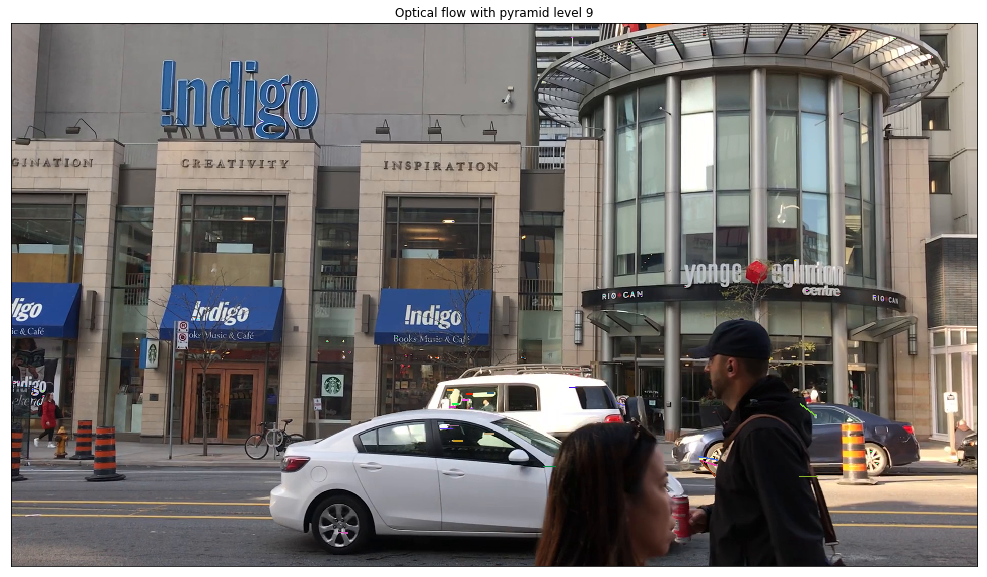

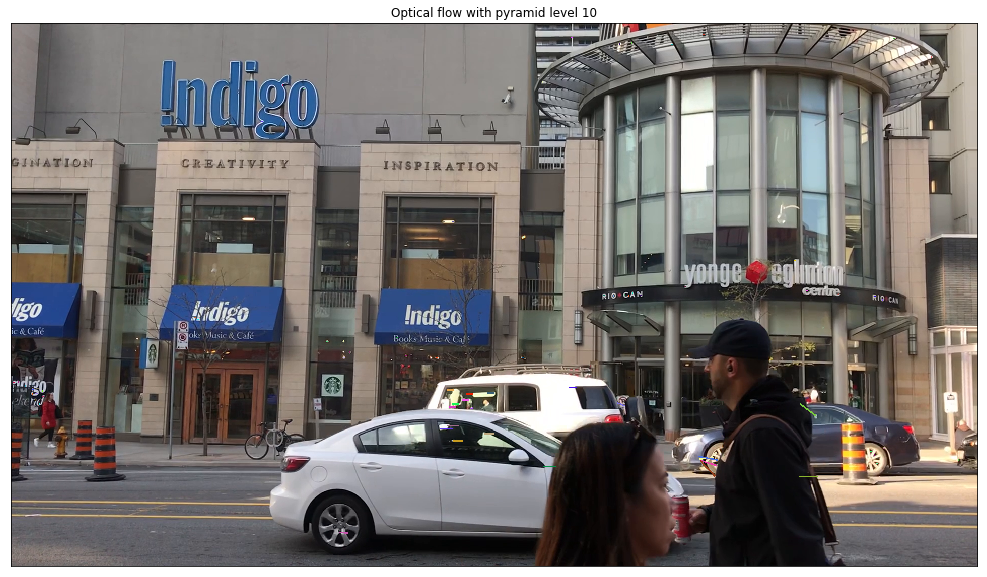

In [12]:
for f in range(11):
    good_new = p10[f][status==1]

    mask = frame1.copy() #create copy of image in order to draw optical flow
    
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a, b = new.ravel()
        c, d = old.ravel()
        mask = cv2.line(mask, (a,b), (c,d), color[i].tolist(), 2)
    
    plt.figure(figsize=(20,10))
    plt.imshow(mask), plt.xticks([]), plt.yticks([])
    plt.title('Optical flow with pyramid level {}'. format(f))
    plt.show()

One can see from the images displayed above that the image with Pyramid level 0 is significantly different from the others ones. The later images are similar to each other.